# Sao Paulo Municipalities Polygons GeoJSON

## Installations

In [2]:
# !pip3 install --upgrade pip

In [3]:
# %pip install geopandas
# %pip install tabulate
# pip install contextily

## Imports

In [ ]:
import sys

from tabulate import tabulate
import numpy as np
import pandas as pd

import geopandas

from shapely.geometry import Point

import folium

import matplotlib.pyplot as plt
%matplotlib inline

import contextily as cx

## Display Imports & Their Versions

In [5]:
headers = ["Software/Library", "Version"]

table_data = [
    ['Python', sys.version[0:6]],
    ['NumPy', np.__version__],
    ['Pandas', pd.__version__],
    ['geopandas', geopandas.__version__]
    ]

print(tabulate(table_data, headers=headers, tablefmt="grid"))

+--------------------+-----------+
| Software/Library   | Version   |
+====================+===========+
| Python             | 3.11.4    |
+--------------------+-----------+
| NumPy              | 1.26.4    |
+--------------------+-----------+
| Pandas             | 1.5.3     |
+--------------------+-----------+
| geopandas          | 1.0.1     |
+--------------------+-----------+


## Import Dataset

In [6]:
gdf = geopandas.read_file("saopaulo.json")

gdf

,CODMUNIC,NOMEMUNICP,NOMEMUNIC,CODUF,NOMEUF_1,NOMEUF_2,REGIAO_1,REGIAO_2,CODMESO,NOMEMESO,CODMICRO,NOMEMICRO,CODUFMESO,CODUFMESOM,AREA_97,ID,geometry
0,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,1,"POLYGON ((-45.02603 -23.74012, -45.02372 -23.7..."
1,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,2,"POLYGON ((-45.153 -23.82729, -45.15525 -23.828..."
2,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,3,"POLYGON ((-45.15556 -23.79884, -45.15905 -23.8..."
3,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,4,"POLYGON ((-45.03228 -23.74075, -45.03433 -23.7..."
4,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,5,"POLYGON ((-45.28953 -23.5921, -45.29269 -23.59..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
645,3556305,VALPARAISO,Valpara�so,35,SAO PAULO,SP,SUDESTE,SE,03,ARACATUBA,17,ARACATUBA,3503,350317,"858,6755",646,"POLYGON ((-50.79731 -20.98386, -50.79992 -20.9..."
646,3557105,VOTUPORANGA,Votuporanga,35,SAO PAULO,SP,SUDESTE,SE,01,SAO JOSE DO RIO PRETO,03,VOTUPORANGA,3501,350103,"421,6671",647,"POLYGON ((-50.05416 -20.33678, -50.05564 -20.3..."
647,3557154,ZACARIAS,Zacarias,35,SAO PAULO,SP,SUDESTE,SE,01,SAO JOSE DO RIO PRETO,04,SAO JOSE DO RIO PRETO,3501,350104,"318,8052",648,"POLYGON ((-49.98992 -21.2249, -49.98627 -21.22..."
648,3557204,CHAVANTES,Chavantes,35,SAO PAULO,SP,SUDESTE,SE,10,ASSIS,40,OURINHOS,3510,351040,"187,6669",649,"POLYGON ((-49.81908 -23.07655, -49.81345 -23.0..."


In [8]:
gdf.describe(include='all')

,CODMUNIC,NOMEMUNICP,NOMEMUNIC,CODUF,NOMEUF_1,NOMEUF_2,REGIAO_1,REGIAO_2,CODMESO,NOMEMESO,CODMICRO,NOMEMICRO,CODUFMESO,CODUFMESOM,AREA_97,ID,geometry
count,645,645,645,645,645,645,645,645,645,645,645,645,645,645,645,650.00000,650
unique,645,645,645,1,1,1,1,1,15,15,63,63,15,63,645,NaN,650
top,3500105,ADAMANTINA,Adamantina,35,SAO PAULO,SP,SUDESTE,SE,01,SAO JOSE DO RIO PRETO,36,PRESIDENTE PRUDENTE,3501,350836,"411,7792",NaN,"POLYGON ((-45.02602777777777 -23.7401175, -45...."
freq,1,1,1,645,645,645,645,645,109,109,30,30,109,30,1,NaN,1
mean,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,325.50000,NaN
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,187.78312,NaN
min,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.00000,NaN
25%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,163.25000,NaN
50%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,325.50000,NaN
75%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,487.75000,NaN


### Remove Null Samples

In [9]:
gdf = gdf.dropna(how='any')

gdf

,CODMUNIC,NOMEMUNICP,NOMEMUNIC,CODUF,NOMEUF_1,NOMEUF_2,REGIAO_1,REGIAO_2,CODMESO,NOMEMESO,CODMICRO,NOMEMICRO,CODUFMESO,CODUFMESOM,AREA_97,ID,geometry
5,3500105,ADAMANTINA,Adamantina,35,SAO PAULO,SP,SUDESTE,SE,08,PRESIDENTE PRUDENTE,35,ADAMANTINA,3508,350835,"411,7792",6,"POLYGON ((-50.99222 -21.43685, -50.99542 -21.4..."
6,3500204,ADOLFO,Adolfo,35,SAO PAULO,SP,SUDESTE,SE,01,SAO JOSE DO RIO PRETO,04,SAO JOSE DO RIO PRETO,3501,350104,"210,8163",7,"POLYGON ((-49.62169 -21.35663, -49.6188 -21.35..."
7,3500303,AGUAI,Agua�,35,SAO PAULO,SP,SUDESTE,SE,07,CAMPINAS,29,PIRASSUNUNGA,3507,350729,"473,3618",8,"POLYGON ((-47.19444 -21.97297, -47.19606 -21.9..."
8,3500402,AGUAS DA PRATA,�guas da Prata,35,SAO PAULO,SP,SUDESTE,SE,07,CAMPINAS,30,SAO JOAO DA BOA VISTA,3507,350730,"142,5886",9,"POLYGON ((-46.74964 -21.83223, -46.75133 -21.8..."
9,3500501,AGUAS DE LINDOIA,�guas de Lind�ia,35,SAO PAULO,SP,SUDESTE,SE,07,CAMPINAS,33,AMPARO,3507,350733,"59,99524",10,"POLYGON ((-46.59789 -22.51445, -46.59464 -22.5..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
645,3556305,VALPARAISO,Valpara�so,35,SAO PAULO,SP,SUDESTE,SE,03,ARACATUBA,17,ARACATUBA,3503,350317,"858,6755",646,"POLYGON ((-50.79731 -20.98386, -50.79992 -20.9..."
646,3557105,VOTUPORANGA,Votuporanga,35,SAO PAULO,SP,SUDESTE,SE,01,SAO JOSE DO RIO PRETO,03,VOTUPORANGA,3501,350103,"421,6671",647,"POLYGON ((-50.05416 -20.33678, -50.05564 -20.3..."
647,3557154,ZACARIAS,Zacarias,35,SAO PAULO,SP,SUDESTE,SE,01,SAO JOSE DO RIO PRETO,04,SAO JOSE DO RIO PRETO,3501,350104,"318,8052",648,"POLYGON ((-49.98992 -21.2249, -49.98627 -21.22..."
648,3557204,CHAVANTES,Chavantes,35,SAO PAULO,SP,SUDESTE,SE,10,ASSIS,40,OURINHOS,3510,351040,"187,6669",649,"POLYGON ((-49.81908 -23.07655, -49.81345 -23.0..."


### Return Information About Unqiue Values in Select Features

In [10]:
cols_to_check = [
    "CODMUNIC",
    "NOMEMUNICP",
    "NOMEMUNIC",
    "CODUF",
    "NOMEUF_1",
    "NOMEUF_2",
    "REGIAO_1",
    "REGIAO_2",
    "CODMESO",
    "NOMEMESO",
    "CODMICRO",
    "NOMEMICRO",
    "CODUFMESO",
    "CODUFMESOM",
    "AREA_97",
    "ID"
]

for col in cols_to_check:
    u_vals = np.sort(gdf[col].unique())
    if len(u_vals) < 80:
        print(f"{col} ({len(u_vals)})\n{u_vals}\n")
    else:
        print(f"{col} ({len(u_vals)})\n")

CODMUNIC (645)

NOMEMUNICP (645)

NOMEMUNIC (645)

CODUF (1)
['35']

NOMEUF_1 (1)
['SAO PAULO']

NOMEUF_2 (1)
['SP']

REGIAO_1 (1)
['SUDESTE']

REGIAO_2 (1)
['SE']

CODMESO (15)
['01' '02' '03' '04' '05' '06' '07' '08' '09' '10' '11' '12' '13' '14'
 '15']

NOMEMESO (15)
['ARACATUBA' 'ARARAQUARA' 'ASSIS' 'BAURU' 'CAMPINAS' 'ITAPETININGA'
 'LITORAL SUL PAULISTA' 'MACRO METROPOLITANA PAULISTA' 'MARILIA'
 'METROPOLITANA DE SAO PAULO' 'PIRACICABA' 'PRESIDENTE PRUDENTE'
 'RIBEIRAO PRETO' 'SAO JOSE DO RIO PRETO' 'VALE DO PARAIBA PAULISTA']

CODMICRO (63)
['01' '02' '03' '04' '05' '06' '07' '08' '09' '10' '11' '12' '13' '14'
 '15' '16' '17' '18' '19' '20' '21' '22' '23' '24' '25' '26' '27' '28'
 '29' '30' '31' '32' '33' '34' '35' '36' '37' '38' '39' '40' '41' '42'
 '43' '44' '45' '46' '47' '48' '49' '50' '51' '52' '53' '54' '55' '56'
 '57' '58' '59' '60' '61' '62' '63']

NOMEMICRO (63)
['ADAMANTINA' 'AMPARO' 'ANDRADINA' 'ARACATUBA' 'ARARAQUARA' 'ASSIS'
 'AURIFLAMA' 'AVARE' 'BANANAL' 'BARRETOS'

### Remove Select Features 

In [11]:
cols_to_remove = [
    "NOMEMUNICP",
    "NOMEMUNIC",
    "CODUF",
    "NOMEUF_1",
    "NOMEUF_2",
    "REGIAO_1",
    "REGIAO_2",
    "NOMEMESO",
    "ID"
]

gdf.drop(columns=cols_to_remove, inplace=True)

gdf

/var/folders/93/v_c2ph_17t97zdkzc4_ccjtw0000gn/T/ipykernel_80594/2450507634.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gdf.drop(columns=cols_to_remove, inplace=True)


,CODMUNIC,CODMESO,CODMICRO,NOMEMICRO,CODUFMESO,CODUFMESOM,AREA_97,geometry
5,3500105,08,35,ADAMANTINA,3508,350835,"411,7792","POLYGON ((-50.99222 -21.43685, -50.99542 -21.4..."
6,3500204,01,04,SAO JOSE DO RIO PRETO,3501,350104,"210,8163","POLYGON ((-49.62169 -21.35663, -49.6188 -21.35..."
7,3500303,07,29,PIRASSUNUNGA,3507,350729,"473,3618","POLYGON ((-47.19444 -21.97297, -47.19606 -21.9..."
8,3500402,07,30,SAO JOAO DA BOA VISTA,3507,350730,"142,5886","POLYGON ((-46.74964 -21.83223, -46.75133 -21.8..."
9,3500501,07,33,AMPARO,3507,350733,"59,99524","POLYGON ((-46.59789 -22.51445, -46.59464 -22.5..."
...,...,...,...,...,...,...,...,...
645,3556305,03,17,ARACATUBA,3503,350317,"858,6755","POLYGON ((-50.79731 -20.98386, -50.79992 -20.9..."
646,3557105,01,03,VOTUPORANGA,3501,350103,"421,6671","POLYGON ((-50.05416 -20.33678, -50.05564 -20.3..."
647,3557154,01,04,SAO JOSE DO RIO PRETO,3501,350104,"318,8052","POLYGON ((-49.98992 -21.2249, -49.98627 -21.22..."
648,3557204,10,40,OURINHOS,3510,351040,"187,6669","POLYGON ((-49.81908 -23.07655, -49.81345 -23.0..."


### Rename Features as Needed

In [39]:
cols_to_rename = {
    "CODMUNIC": "municipality_code",
    "CODMESO": "micro_region_code",
    "CODMICRO": "micro_region_code_se",
    "NOMEMICRO": "micro_region_name",
    "CODUFMESO": "meso_region_code",
    "CODUFMESOM": "meso_region_code_ext",
    "AREA_97": "area_in_1997"
}

gdf.rename(columns=cols_to_rename, inplace=True)

gdf.head()

/var/folders/93/v_c2ph_17t97zdkzc4_ccjtw0000gn/T/ipykernel_80594/1971408295.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gdf.rename(columns=cols_to_rename, inplace=True)


,municipality_code,micro_region_code,micro_region_code_se,micro_region_name,meso_region_code,meso_region_code_ext,area_in_1997,geometry
5,3500105,08,35,ADAMANTINA,3508,350835,"411,7792","POLYGON ((-50.99222 -21.43685, -50.99542 -21.4..."
6,3500204,01,04,SAO JOSE DO RIO PRETO,3501,350104,"210,8163","POLYGON ((-49.62169 -21.35663, -49.6188 -21.35..."
7,3500303,07,29,PIRASSUNUNGA,3507,350729,"473,3618","POLYGON ((-47.19444 -21.97297, -47.19606 -21.9..."
8,3500402,07,30,SAO JOAO DA BOA VISTA,3507,350730,"142,5886","POLYGON ((-46.74964 -21.83223, -46.75133 -21.8..."
9,3500501,07,33,AMPARO,3507,350733,"59,99524","POLYGON ((-46.59789 -22.51445, -46.59464 -22.5..."


## Data Visualizations

### Non-Interactive Data Visualization

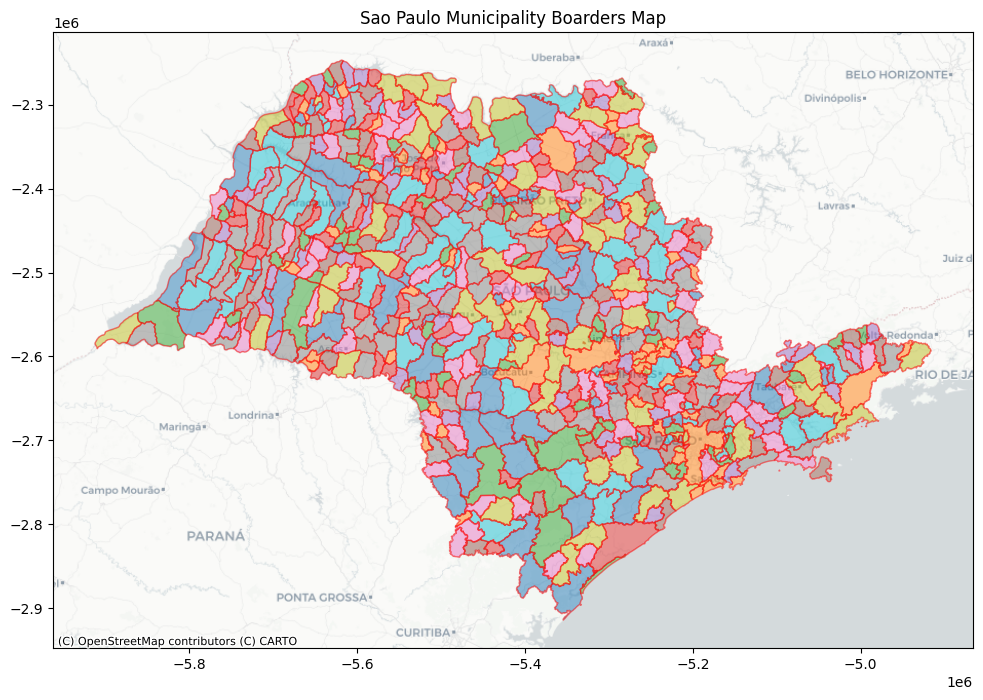

In [13]:
gdf_plot = gdf.to_crs(epsg=3857)

fig, ax = plt.subplots(figsize=(24, 8))
gdf_plot.plot(column='area_in_1997', ax=ax, alpha=0.5, edgecolor="red")

cx.add_basemap(ax, source=cx.providers.CartoDB.Positron)

ax.set_title("Sao Paulo Municipality Boarders Map")

plt.show()

### Interactive Data Visualization

In [14]:
gdf.explore(
    m = folium.Map(
        location=[-23,-47], 
        tiles='OpenStreetMap', # CartoDB Voyager, OpenStreetMap
        zoom_start=6,
        prefer_canvas=True
        ),
    popup=True,
    highlight=True,
    legend=True,
    control_scale=True,
    style_kwds = {
        'stroke': True,
        'color': '#3271a5',
        'weight': 1,
        'opacity': 0.75,
        'fill': True,
        'fillColor': '#b8e2f4',
        'fillOpacity': 0.35
    },
    highlight_kwds ={
        'stroke': True,
        'color': 'red',
        'weight': 2,
        'opacity': 1,
        'fill': True,
        'fillColor': '#FF474C',
        'fillOpacity': 0.35
    },
    tooltip_kwds = {
        'labels': True,
        'aliases': [
            'Municipality Code',
            'Micro Region Code',
            'Micro Region Code SE',
            'Micro Region Name',
            'Meso Region Code',
            'Meso Region Code Extended',
            'Area (as of 1997)'
        ]
    }
)





## Time For Fun With Functions

### Append Geometry Type Feature to GeoDataFrame

In [15]:
print("Geometry Type")

gdf_gt = gdf.copy()
gdf_gt['geometry_type'] = gdf.geom_type

gdf_gt

Geometry Type


,municipality_code,micro_region_code,micro_region_code_se,micro_region_name,meso_region_code,meso_region_code_ext,area_in_1997,geometry,geometry_type
5,3500105,08,35,ADAMANTINA,3508,350835,"411,7792","POLYGON ((-50.99222 -21.43685, -50.99542 -21.4...",Polygon
6,3500204,01,04,SAO JOSE DO RIO PRETO,3501,350104,"210,8163","POLYGON ((-49.62169 -21.35663, -49.6188 -21.35...",Polygon
7,3500303,07,29,PIRASSUNUNGA,3507,350729,"473,3618","POLYGON ((-47.19444 -21.97297, -47.19606 -21.9...",Polygon
8,3500402,07,30,SAO JOAO DA BOA VISTA,3507,350730,"142,5886","POLYGON ((-46.74964 -21.83223, -46.75133 -21.8...",Polygon
9,3500501,07,33,AMPARO,3507,350733,"59,99524","POLYGON ((-46.59789 -22.51445, -46.59464 -22.5...",Polygon
...,...,...,...,...,...,...,...,...,...
645,3556305,03,17,ARACATUBA,3503,350317,"858,6755","POLYGON ((-50.79731 -20.98386, -50.79992 -20.9...",Polygon
646,3557105,01,03,VOTUPORANGA,3501,350103,"421,6671","POLYGON ((-50.05416 -20.33678, -50.05564 -20.3...",Polygon
647,3557154,01,04,SAO JOSE DO RIO PRETO,3501,350104,"318,8052","POLYGON ((-49.98992 -21.2249, -49.98627 -21.22...",Polygon
648,3557204,10,40,OURINHOS,3510,351040,"187,6669","POLYGON ((-49.81908 -23.07655, -49.81345 -23.0...",Polygon


### Add Distance Features to Dataset

In [16]:
# Use the Harvard address coordinates as the reference point for distances
latitude = 42.3745
longitude = -71.1185

# Create a Shapely Point object
ref_point = Point(longitude, latitude)

if gdf.crs is None:
    gdf.set_crs(epsg=4326, inplace=True)

# Estimate an appropriate UTM CRS for your GeoDataFrame
utm_crs = gdf.estimate_utm_crs()

# Reproject your GeoDataFrame to the estimated UTM CRS
gdf_projected = gdf.to_crs(utm_crs)

# Reproject the reference point to the same UTM CRS
ref_point_projected = geopandas.GeoSeries([ref_point], crs='EPSG:4326').to_crs(utm_crs).iloc[0]

In [17]:
# Calculate distances
gdf_projected['dist_from_harvard'] = gdf_projected['geometry'].distance(ref_point_projected)
gdf_projected['frechet_dist_from_harvard'] = gdf_projected['geometry'].frechet_distance(ref_point_projected)
gdf_projected['hausdorff_dist_from_harvard'] = gdf_projected['geometry'].hausdorff_distance(ref_point_projected)

gdf_projected

,municipality_code,micro_region_code,micro_region_code_se,micro_region_name,meso_region_code,meso_region_code_ext,area_in_1997,geometry,dist_from_harvard,frechet_dist_from_harvard,hausdorff_dist_from_harvard
5,3500105,08,35,ADAMANTINA,3508,350835,"411,7792","POLYGON ((500805.989 7629503.739, 500474.739 7...",7.444041e+06,7.482948e+06,7.482948e+06
6,3500204,01,04,SAO JOSE DO RIO PRETO,3501,350104,"210,8163","POLYGON ((642913.003 7637755.771, 643213.513 7...",7.456264e+06,7.476026e+06,7.476026e+06
7,3500303,07,29,PIRASSUNUNGA,3507,350729,"473,3618","POLYGON ((893096.756 7565275.311, 892929.692 7...",7.608064e+06,7.634719e+06,7.634719e+06
8,3500402,07,30,SAO JOAO DA BOA VISTA,3507,350730,"142,5886","POLYGON ((939533.419 7579671.917, 939351.447 7...",7.606353e+06,7.631255e+06,7.631255e+06
9,3500501,07,33,AMPARO,3507,350733,"59,99524","POLYGON ((953049.655 7503556.01, 953385.948 75...",7.675551e+06,7.684982e+06,7.684982e+06
...,...,...,...,...,...,...,...,...,...,...,...
645,3556305,03,17,ARACATUBA,3503,350317,"858,6755","POLYGON ((521068.061 7679625.15, 520797.033 76...",7.398861e+06,7.449801e+06,7.449801e+06
646,3557105,01,03,VOTUPORANGA,3501,350103,"421,6671","POLYGON ((598730.588 7750966.272, 598568.837 7...",7.352364e+06,7.382311e+06,7.382311e+06
647,3557154,01,04,SAO JOSE DO RIO PRETO,3501,350104,"318,8052","POLYGON ((604822.625 7652627.418, 605201.693 7...",7.425042e+06,7.451161e+06,7.451161e+06
648,3557204,10,40,OURINHOS,3510,351040,"187,6669","POLYGON ((620959.707 7447517.397, 621535.694 7...",7.642030e+06,7.664527e+06,7.664527e+06


### Retrieve Coordinates

In [18]:
gdf_get_coords = gdf.get_coordinates(include_z=True)
gdf_count_coords = gdf.count_coordinates()
gdf_count_geos = gdf.count_geometries()

print(f"GDF Coordinates:\n{gdf_get_coords}\n")
print(f"GDF Count Coordinates:\n{gdf_count_coords}\n")
print(f"GDF Count Geometries:\n{gdf_count_geos}")

GDF Coordinates:
             x          y   z
5   -50.992222 -21.436850 NaN
5   -50.995419 -21.436754 NaN
5   -50.996056 -21.437850 NaN
5   -51.000000 -21.439123 NaN
5   -51.003250 -21.438716 NaN
..         ...        ...  ..
649 -46.909141 -22.257929 NaN
649 -46.905777 -22.249958 NaN
649 -46.901748 -22.247742 NaN
649 -46.899330 -22.245165 NaN
649 -46.897499 -22.204639 NaN

[124889 rows x 3 columns]

GDF Count Coordinates:
5      239
6      159
7      283
8      104
9       70
      ... 
645    278
646    233
647    150
648    150
649     34
Length: 645, dtype: int32

GDF Count Geometries:
5      1
6      1
7      1
8      1
9      1
      ..
645    1
646    1
647    1
648    1
649    1
Length: 645, dtype: int32


### Some Basic Functions

In [19]:
gdf_is_simple = gdf.is_simple
gdf_is_valid = gdf.is_valid
gdf_is_valid_reason = gdf.is_valid_reason()
gdf_has_z = gdf.has_z

gdf_is_simple_value_counts = gdf_is_simple.value_counts()
gdf_is_valid_value_counts = gdf_is_valid.value_counts()
gdf_is_valid_reason_value_counts = gdf_is_valid_reason.value_counts()
gdf_has_z_value_counts = gdf_has_z.value_counts()

print(f"is_simple:\n{gdf_is_simple_value_counts}\n")
print(f"is_valid:\n{gdf_is_valid_value_counts}\n")
print(f"is_valid_reason:\n{gdf_is_valid_reason_value_counts}\n")
print(f"has_z:\n{gdf_has_z_value_counts}\n")

is_simple:
True    645
dtype: int64

is_valid:
True    645
dtype: int64

is_valid_reason:
Valid Geometry    645
dtype: int64

has_z:
False    645
dtype: int64



### Check if Points Are Within Mapped Polygons

In [20]:
points_to_use = geopandas.GeoSeries([
    Point(-95.67804, 39.04833), # Topeka, Kansas, USA
    Point(-114.0719, 51.0447),  # Calgary, Alberta, Canada
    Point(80.0, -10.0),         # Midpoint in the Indian Ocean
    Point(-19.0208, 64.9631),   # Center of Iceland
    Point(31.1342, 29.9792),    # Pyramids of Giza, Egypt
    Point(86.9250, 27.9881),    # Mount Everest, Nepal
    Point(149.1300, -35.2809)   # Canberra, Australia (Capital City)
])

# Create a GeoDataFrame from points
points_to_use = geopandas.GeoDataFrame(geometry=points_to_use)

# Ensure both GeoDataFrames have the same CRS
points_to_use = points_to_use.set_crs(gdf.crs, allow_override=True)

# Perform spatial join to find points within polygons
points_within = geopandas.sjoin(points_to_use, gdf, predicate='within', how='inner')

print("points_within")
print(points_within)

points_within
Empty GeoDataFrame
Columns: [geometry, index_right, municipality_code, micro_region_code, micro_region_code_se, micro_region_name, meso_region_code, meso_region_code_ext, area_in_1997]
Index: []


### Check if Points Are NOT Within Mapped Polygons

In [21]:
points_not_within = points_to_use[~points_to_use.index.isin(points_within.index)]

print("points_not_within")
print(points_not_within)

points_not_within
                     geometry
0  POINT (-95.67804 39.04833)
1   POINT (-114.0719 51.0447)
2              POINT (80 -10)
3    POINT (-19.0208 64.9631)
4     POINT (31.1342 29.9792)
5      POINT (86.925 27.9881)
6     POINT (149.13 -35.2809)


### Some Basic Functions

In [22]:
gdf.boundary

5      LINESTRING (-50.99222 -21.43685, -50.99542 -21...
6      LINESTRING (-49.62169 -21.35663, -49.6188 -21....
7      LINESTRING (-47.19444 -21.97297, -47.19606 -21...
8      LINESTRING (-46.74964 -21.83223, -46.75133 -21...
9      LINESTRING (-46.59789 -22.51445, -46.59464 -22...
                             ...                        
645    LINESTRING (-50.79731 -20.98386, -50.79992 -20...
646    LINESTRING (-50.05416 -20.33678, -50.05564 -20...
647    LINESTRING (-49.98992 -21.2249, -49.98627 -21....
648    LINESTRING (-49.81908 -23.07655, -49.81345 -23...
649    LINESTRING (-46.8975 -22.20464, -46.89992 -22....
Length: 645, dtype: geometry

In [23]:
gdf_projected.buffer(distance=125)

5      POLYGON ((486866.347 7595675.51, 486744.265 75...
6      POLYGON ((642894.495 7637632.149, 642681.564 7...
7      POLYGON ((892791.699 7564996.63, 892785.775 75...
8      POLYGON ((939428.226 7579739.862, 939584.953 7...
9      POLYGON ((949341.075 7505885.415, 948850.068 7...
                             ...                        
645    POLYGON ((495112.849 7633014.381, 494403.798 7...
646    POLYGON ((598619.548 7751023.674, 598928.02 77...
647    POLYGON ((589962.413 7663586.859, 589962.789 7...
648    POLYGON ((620938.433 7447640.574, 621373.745 7...
649    POLYGON ((923238.099 7538782.065, 922927.145 7...
Length: 645, dtype: geometry

In [24]:
gdf_projected.centroid

5      POINT (494197.682 7614089.964)
6      POINT (639751.662 7645411.299)
7      POINT (908877.221 7556406.204)
8       POINT (945321.227 7570498.09)
9      POINT (952630.225 7508031.171)
                    ...              
645    POINT (507906.972 7655396.846)
646    POINT (605458.699 7737582.314)
647    POINT (598739.536 7663748.376)
648    POINT (630521.517 7450844.817)
649    POINT (918376.996 7535505.682)
Length: 645, dtype: geometry

In [25]:
gdf.convex_hull

5      POLYGON ((-51.09127 -21.76558, -51.13639 -21.7...
6      POLYGON ((-49.68661 -21.36349, -49.69286 -21.3...
7      POLYGON ((-46.94456 -22.14676, -47.13986 -22.1...
8      POLYGON ((-46.61736 -22.01717, -46.62772 -22.0...
9      POLYGON ((-46.58314 -22.51586, -46.60609 -22.5...
                             ...                        
645    POLYGON ((-51 -21.43912, -51.00325 -21.43872, ...
646    POLYGON ((-49.95542 -20.57557, -49.96264 -20.5...
647    POLYGON ((-49.99364 -21.22607, -50.09142 -21.2...
648    POLYGON ((-49.71603 -23.14803, -49.71822 -23.1...
649    POLYGON ((-46.95625 -22.295, -46.96853 -22.294...
Length: 645, dtype: geometry

In [26]:
gdf.envelope

5      POLYGON ((-51.17758 -21.76558, -50.96433 -21.7...
6      POLYGON ((-49.74575 -21.36349, -49.56742 -21.3...
7      POLYGON ((-47.23339 -22.14676, -46.86039 -22.1...
8      POLYGON ((-46.75786 -22.01717, -46.61203 -22.0...
9      POLYGON ((-46.65994 -22.51586, -46.54839 -22.5...
                             ...                        
645    POLYGON ((-51.14494 -21.43912, -50.74395 -21.4...
646    POLYGON ((-50.15542 -20.57557, -49.85283 -20.5...
647    POLYGON ((-50.14891 -21.22607, -49.95839 -21.2...
648    POLYGON ((-49.81908 -23.14803, -49.66506 -23.1...
649    POLYGON ((-46.98305 -22.295, -46.8975 -22.295,...
Length: 645, dtype: geometry

In [27]:
gdf.extract_unique_points()

5      MULTIPOINT (-50.99222 -21.43685, -50.99542 -21...
6      MULTIPOINT (-49.62169 -21.35663, -49.6188 -21....
7      MULTIPOINT (-47.19444 -21.97297, -47.19606 -21...
8      MULTIPOINT (-46.74964 -21.83223, -46.75133 -21...
9      MULTIPOINT (-46.59789 -22.51445, -46.59464 -22...
                             ...                        
645    MULTIPOINT (-50.79731 -20.98386, -50.79992 -20...
646    MULTIPOINT (-50.05416 -20.33678, -50.05564 -20...
647    MULTIPOINT (-49.98992 -21.2249, -49.98627 -21....
648    MULTIPOINT (-49.81908 -23.07655, -49.81345 -23...
649    MULTIPOINT (-46.8975 -22.20464, -46.89992 -22....
Length: 645, dtype: geometry

In [28]:
gdf.force_2d()

5      POLYGON ((-50.99222 -21.43685, -50.99542 -21.4...
6      POLYGON ((-49.62169 -21.35663, -49.6188 -21.35...
7      POLYGON ((-47.19444 -21.97297, -47.19606 -21.9...
8      POLYGON ((-46.74964 -21.83223, -46.75133 -21.8...
9      POLYGON ((-46.59789 -22.51445, -46.59464 -22.5...
                             ...                        
645    POLYGON ((-50.79731 -20.98386, -50.79992 -20.9...
646    POLYGON ((-50.05416 -20.33678, -50.05564 -20.3...
647    POLYGON ((-49.98992 -21.2249, -49.98627 -21.22...
648    POLYGON ((-49.81908 -23.07655, -49.81345 -23.0...
649    POLYGON ((-46.8975 -22.20464, -46.89992 -22.20...
Length: 645, dtype: geometry

In [29]:
gdf.minimum_bounding_circle()

5      POLYGON ((-50.89716 -21.58134, -50.9007 -21.61...
6      POLYGON ((-49.55621 -21.29102, -49.55805 -21.3...
7      POLYGON ((-46.86038 -22.05117, -46.86396 -22.0...
8      POLYGON ((-46.5583 -21.91722, -46.56055 -21.93...
9      POLYGON ((-46.54693 -22.46761, -46.54803 -22.4...
                             ...                        
645    POLYGON ((-50.69727 -21.17248, -50.70243 -21.2...
646    POLYGON ((-49.8467 -20.45952, -49.84972 -20.49...
647    POLYGON ((-49.91864 -21.11641, -49.92095 -21.1...
648    POLYGON ((-49.6086 -23.03954, -49.61069 -23.06...
649    POLYGON ((-46.88527 -22.24063, -46.8864 -22.25...
Length: 645, dtype: geometry

In [30]:
gdf.minimum_clearance()

5      0.001189
6      0.001257
7      0.001236
8      0.001485
9      0.001313
         ...   
645    0.001189
646    0.000708
647    0.001201
648    0.001187
649    0.001226
Length: 645, dtype: float64

In [31]:
gdf.minimum_rotated_rectangle()

5      POLYGON ((-51.04868 -21.78873, -50.92653 -21.4...
6      POLYGON ((-49.75352 -21.35503, -49.57935 -21.3...
7      POLYGON ((-46.84978 -21.99022, -47.21035 -21.9...
8      POLYGON ((-46.7676 -21.82648, -46.70654 -22.04...
9      POLYGON ((-46.6097 -22.40636, -46.66436 -22.48...
                             ...                        
645    POLYGON ((-50.96597 -21.48645, -50.68133 -21.0...
646    POLYGON ((-49.95515 -20.63066, -49.83227 -20.4...
647    POLYGON ((-50.00622 -21.26651, -49.9042 -21.07...
648    POLYGON ((-49.69175 -23.16214, -49.5959 -22.98...
649    POLYGON ((-46.88805 -22.28719, -46.9005 -22.17...
Length: 645, dtype: geometry

In [32]:
gdf.normalize()

5      POLYGON ((-51.17758 -21.6869, -51.17367 -21.68...
6      POLYGON ((-49.74575 -21.31284, -49.74569 -21.3...
7      POLYGON ((-47.23339 -22.05322, -47.22589 -22.0...
8      POLYGON ((-46.75786 -21.84546, -46.75647 -21.8...
9      POLYGON ((-46.65994 -22.48043, -46.6598 -22.47...
                             ...                        
645    POLYGON ((-51.14494 -21.37197, -51.14248 -21.3...
646    POLYGON ((-50.15542 -20.50305, -50.15342 -20.5...
647    POLYGON ((-50.14891 -21.13932, -50.14506 -21.1...
648    POLYGON ((-49.81908 -23.07655, -49.81364 -23.0...
649    POLYGON ((-46.98305 -22.19959, -46.98264 -22.1...
Length: 645, dtype: geometry

In [33]:
gdf.active_geometry_name

'geometry'

### Display Translated (Shifted) Polygons

In [34]:
translated_gdf = gdf.translate(xoff=-0.05, yoff=0.05)

translated_gdf.explore()

### Iterate Through All Rows

In [ ]:
for index, row in gdf.iterrows():
    print("All Data:", row)

# I cleared the results (even they printed perfectly) to reduce the file size so that I could more easily upload this file to GitHub.

### Iterate Through All Features

In [ ]:
for feature in gdf.iterfeatures():
    print(feature)

# I cleared the results (even they printed perfectly) to reduce the file size so that I could more easily upload this file to GitHub.

### Interface

In [ ]:
gdf.__geo_interface__

# I cleared the results (even they printed perfectly) to reduce the file size so that I could more easily upload this file to GitHub.

## Save Cleaned Dataset to File

In [38]:
new_file_name_and_path = 'cleaned_gdf_file.geojson'

gdf.to_file(new_file_name_and_path, driver="geojson")

### Resources Used (links to libraries used in this project)

- GeoPandas: https://geopandas.org/en/stable/